In [2]:
!nvidia-smi

Thu Oct 24 08:58:59 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# Install Ultralytics library
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.1/877.1 kB 16.2 MB/s eta 0:00:00a 0:00:01


In [4]:
pip install -U ray[tune]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 MB 24.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: ray
    Found existing installation: ray 2.24.0
    Uninstalling ray-2.24.0:
      Successfully uninstalled ray-2.24.0
Note: you may need to restart the kernel to use updated packages.


In [5]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

In [7]:
# Load a pretrained YOLOv9 model from Ultralytics
# model = YOLO('yolov9c.pt')
model = YOLO('yolov9e.pt')

100%|██████████| 112M/112M [00:01<00:00, 92.3MB/s] 



image 1/1 /kaggle/input/sample-image/CARDS_LIVINGROOM_B_T_frame_2591_jpg.rf.88854484564f503888556affce0b22fe.jpg: 384x640 2 persons, 1 couch, 1 dining table, 84.1ms
Speed: 7.8ms preprocess, 84.1ms inference, 227.3ms postprocess per image at shape (1, 3, 384, 640)


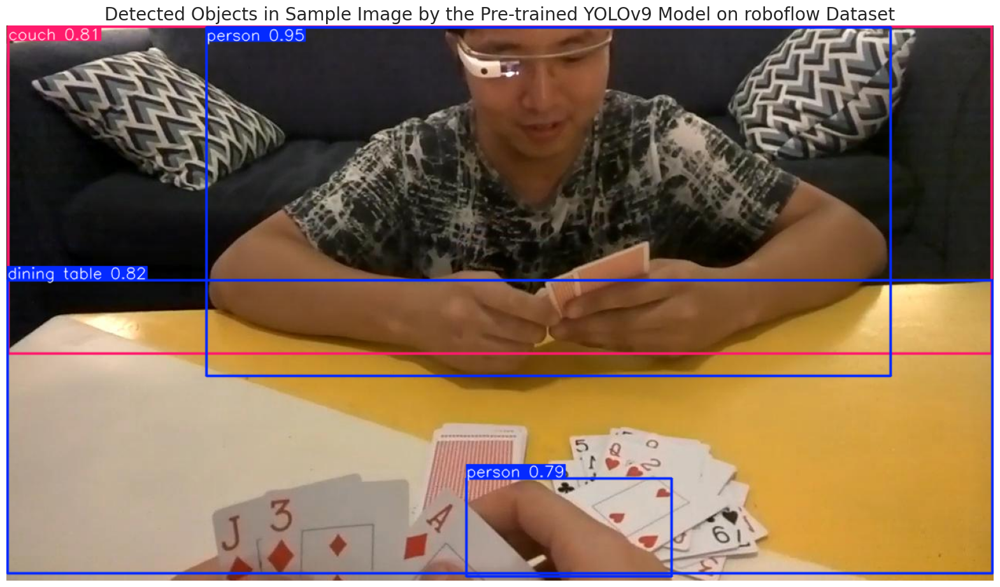

In [8]:
# Path to the image file
image_path = '/kaggle/input/sample-image/CARDS_LIVINGROOM_B_T_frame_2591_jpg.rf.88854484564f503888556affce0b22fe.jpg'

# Perform inference on the provided image(s)
results = model.predict(source=image_path, 
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv9 Model on roboflow Dataset', fontsize=20)
plt.axis('off')
plt.show()

In [9]:
# Define the dataset_path
dataset_path = '/kaggle/input/oxford-handdataset/Oxford_handdataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'Hand.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- hand
nc: 1
train: /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images
val: /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images



In [12]:
dataset_path1='/kaggle/input/oxford-handdataset/Oxford_handdataset/Hand'

In [13]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path1,'train', 'images')
valid_images_path = os.path.join(dataset_path1,'val', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 2846
Number of validation images: 1223
Training images have varying sizes.
Validation images have varying sizes.


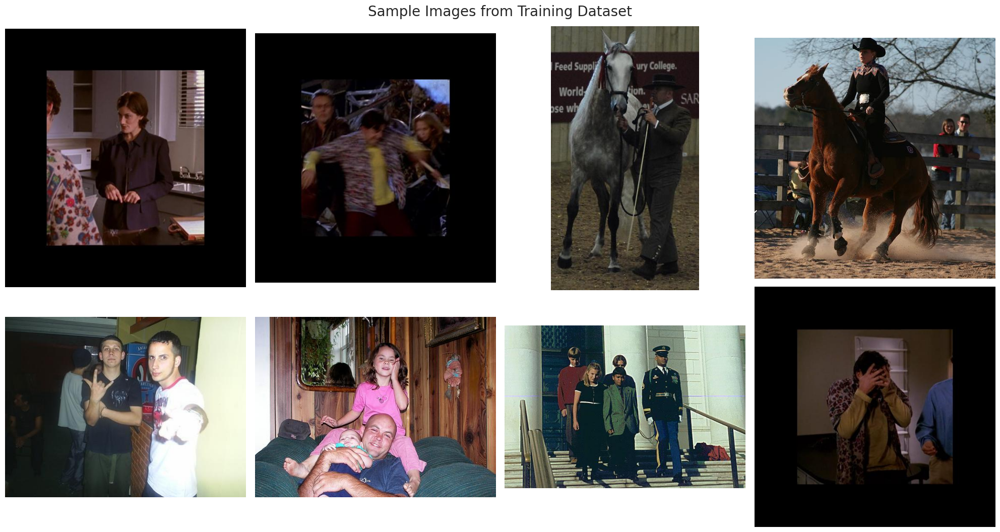

In [14]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')  

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

In [15]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=100,              # Number of epochs to train for
    imgsz=416,               # Size of input images as integer
    device=0,                # Device to run on, i.e. cuda device=0 
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=8,                # Number of images per batch
    optimizer='Adam',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.1,             # Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9e.pt, data=/kaggle/input/oxford-handdataset/Oxford_handdataset/Hand.yaml, epochs=100, time=None, patience=50, batch=8, imgsz=416, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, s

100%|██████████| 755k/755k [00:00<00:00, 13.3MB/s]
2024-10-24 09:07:12,770	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-24 09:07:12,990	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1         0  torch.nn.modules.linear.Identity             []                            
  1                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  2                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  3                  -1  1    252160  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 2]        
  4                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  5                  -1  1   1004032  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 2]       
  6                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  7                  -1  1   4006912  ultralytics

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.42.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 61.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/labels... 2846 images, 0 backgrounds, 1 corrupt: 100%|██████████| 2846/2846 [00:05<00:00, 490.30it/s]

train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_114.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_117.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_120.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_131.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_145.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_173.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/Inria_174.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train/images/In

train: WARNING ⚠️ Cache directory /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/labels... 1223 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1223/1223 [00:02<00:00, 466.24it/s]

val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_1.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_19.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_35.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_40.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_45.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_89.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_90.jpg: 1 duplicate labels removed
va

val: WARNING ⚠️ Cache directory /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.0001, momentum=0.937) with parameter groups 298 weight(decay=0.0), 310 weight(decay=0.0005), 309 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.45G      2.246      2.043      1.505         21        416: 100%|██████████| 356/356 [02:35<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:20<00:00,  3.76it/s]

                   all       1223       2898      0.511      0.395      0.412      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.22G      1.944       1.54      1.299         19        416: 100%|██████████| 356/356 [02:26<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.05it/s]


                   all       1223       2898      0.659      0.567      0.611       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.15G       1.83      1.363      1.237         23        416: 100%|██████████| 356/356 [02:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.756      0.638      0.716      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       6.2G      1.802      1.273      1.217         24        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.02it/s]

                   all       1223       2898      0.741      0.653      0.712      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.15G      1.751      1.216      1.196         14        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.754      0.671      0.743      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       6.2G      1.737      1.155      1.183         18        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.01it/s]

                   all       1223       2898      0.769      0.679      0.753      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.15G      1.693      1.122      1.178         14        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898       0.77      0.689       0.77      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.21G      1.671      1.084      1.163         22        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.794      0.702      0.781      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.15G      1.657      1.049      1.157         15        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898      0.801       0.72      0.795      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.21G      1.631      1.039      1.149         18        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.791      0.721      0.793      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.13G      1.603     0.9829      1.131         13        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898      0.804      0.728      0.803      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       6.2G      1.596     0.9735      1.127         22        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898      0.787      0.726      0.791      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.13G      1.579     0.9551      1.128         22        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.817      0.734      0.813      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       6.2G      1.569     0.9425      1.115         16        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.812      0.733      0.808      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.14G      1.559     0.9182      1.118         15        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.02it/s]

                   all       1223       2898      0.796      0.739      0.795      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.21G      1.556     0.9131      1.114         25        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.02it/s]

                   all       1223       2898      0.819      0.717      0.803      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.14G      1.532     0.8918      1.104         26        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898      0.831      0.735      0.813      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       6.2G      1.507     0.8755      1.103         15        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.813      0.736      0.814      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.13G      1.474     0.8468      1.091         15        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.03it/s]

                   all       1223       2898      0.806      0.747      0.811        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.19G      1.482     0.8555      1.084         20        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898       0.83      0.743      0.823      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.15G      1.471      0.829      1.081         21        416: 100%|██████████| 356/356 [02:23<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.06it/s]

                   all       1223       2898      0.828      0.746      0.821      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       6.2G      1.463     0.8265       1.08         17        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.06it/s]

                   all       1223       2898      0.825      0.742      0.823      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.14G      1.427     0.8077      1.065         22        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.04it/s]

                   all       1223       2898      0.836      0.749      0.827      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.22G      1.418     0.7917      1.064         24        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.06it/s]

                   all       1223       2898      0.827      0.756      0.821      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.13G      1.403     0.7822      1.055         21        416: 100%|██████████| 356/356 [02:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.05it/s]

                   all       1223       2898       0.83      0.745      0.825      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       6.2G      1.409     0.7705      1.049         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.05it/s]

                   all       1223       2898      0.818      0.755      0.821      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.13G      1.382     0.7644      1.047         17        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.07it/s]

                   all       1223       2898      0.826      0.745      0.827      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.19G      1.377     0.7508      1.042         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.06it/s]

                   all       1223       2898      0.823      0.766      0.831      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.15G      1.359     0.7388      1.038         21        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.05it/s]

                   all       1223       2898      0.836      0.749      0.833      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.21G      1.355     0.7358      1.038         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.06it/s]

                   all       1223       2898      0.812      0.768       0.83      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.14G      1.343     0.7295      1.036         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.08it/s]

                   all       1223       2898      0.847      0.748      0.834      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.21G      1.343     0.7292      1.039         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.08it/s]

                   all       1223       2898      0.809      0.777       0.83      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.13G      1.319     0.7071      1.023         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.08it/s]

                   all       1223       2898      0.834      0.753      0.829      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.21G       1.31     0.7159      1.029         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.827      0.774      0.837      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.14G      1.313     0.7023      1.018         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.848      0.742      0.828      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.21G      1.299     0.6959      1.012         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:19<00:00,  4.05it/s]

                   all       1223       2898      0.844      0.751      0.835      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.14G      1.274      0.679      1.011         20        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.08it/s]

                   all       1223       2898      0.832      0.757      0.831      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       6.2G      1.264     0.6709       1.01         15        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.09it/s]

                   all       1223       2898      0.813      0.772      0.831      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.13G      1.271     0.6823      1.008         17        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.836      0.758      0.836      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       6.2G      1.245      0.661      1.003         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.837      0.759      0.833       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.14G      1.238     0.6555      1.001         27        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.823      0.763      0.831      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       6.2G      1.248     0.6648      1.007         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898       0.85      0.743       0.83      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.13G      1.222     0.6463     0.9924         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.864      0.746      0.837      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.21G      1.226     0.6484     0.9931         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.827      0.768      0.835      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.15G      1.214     0.6354     0.9914         27        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.842      0.753       0.83      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.21G       1.21     0.6444     0.9873         15        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.846      0.755      0.832      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.14G      1.201     0.6324     0.9828         23        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898       0.84      0.767      0.839      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.21G      1.201     0.6295     0.9863         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898       0.84      0.766      0.837       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.13G      1.176     0.6262     0.9828         37        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.851      0.762      0.841      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.21G      1.169     0.6149     0.9782         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.847      0.752      0.834      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.16G      1.175      0.614      0.975         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.826      0.778      0.838      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.22G      1.165     0.6052     0.9792         20        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.823      0.777      0.834      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.15G      1.163     0.6044     0.9744         21        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.835      0.771      0.839      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.21G      1.147      0.602     0.9672         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.835      0.765      0.832      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.14G      1.163     0.6041     0.9687         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.848      0.756      0.832      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.19G       1.13     0.5928     0.9618         17        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898       0.83      0.771      0.835      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.13G      1.115     0.5786     0.9622         15        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.862       0.74      0.833      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       6.2G      1.125     0.5831     0.9612         23        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898       0.84      0.759      0.833      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.15G      1.116     0.5869     0.9627         19        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898       0.83      0.771      0.837      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       6.2G       1.12     0.5833     0.9621         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.843      0.774      0.845       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.15G       1.09     0.5667     0.9545          9        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.846      0.768      0.839      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.22G      1.102     0.5694     0.9523         12        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898       0.85      0.754      0.837      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.14G      1.098     0.5647     0.9552         17        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.845      0.763      0.839      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.22G       1.08     0.5579     0.9504         29        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.09it/s]

                   all       1223       2898       0.85      0.759      0.839      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.15G      1.077     0.5574     0.9476         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898       0.86      0.757      0.845      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       6.2G      1.068     0.5466     0.9443         19        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.13it/s]

                   all       1223       2898      0.853      0.758      0.841      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.13G      1.066     0.5465     0.9467         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.837      0.764      0.836      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.22G      1.048     0.5384     0.9399         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.827      0.778      0.838      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.13G      1.043     0.5374      0.942         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.846      0.761      0.837      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       6.2G      1.049     0.5426     0.9472         39        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.831      0.768      0.836      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.13G      1.039     0.5345     0.9414          8        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.839      0.763      0.835      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       6.2G      1.041      0.531     0.9369         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.844      0.778      0.845      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.14G      1.038     0.5316     0.9367         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.838      0.767       0.84      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       6.2G      1.028     0.5275     0.9364         34        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.842      0.764      0.838      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.14G       1.03     0.5298     0.9321         28        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.829      0.769      0.837      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.21G      1.021      0.522     0.9307         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.847      0.759      0.839      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.13G      0.996      0.516     0.9285         15        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.836      0.767      0.833      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       6.2G      1.011     0.5205     0.9289         16        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.842      0.771       0.84      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.14G          1     0.5145     0.9249         19        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.838      0.765      0.836      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.19G      1.005     0.5125     0.9255         18        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.831      0.786      0.841      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.12G     0.9879     0.5089     0.9245         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.834      0.776       0.84       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       6.2G     0.9807      0.506     0.9195         26        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.826       0.78      0.839      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.13G     0.9976     0.5109     0.9214         31        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.828      0.779       0.84      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       6.2G     0.9907     0.5063       0.92         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.13it/s]

                   all       1223       2898      0.832      0.778      0.839      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.13G     0.9761     0.5089     0.9237         20        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898       0.84      0.775      0.839      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       6.2G     0.9775     0.5041     0.9203         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.13it/s]

                   all       1223       2898      0.834      0.776       0.84      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.15G      0.962     0.4936     0.9143         13        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.852      0.769      0.841      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       6.2G     0.9603     0.4943     0.9169         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.831      0.775      0.836      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.14G     0.9561     0.4901     0.9109         31        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.852      0.762      0.839      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.21G     0.9563     0.4922      0.916         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898       0.83      0.774      0.842      0.429


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.15G     0.9177     0.4265     0.9031         11        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.10it/s]

                   all       1223       2898      0.835      0.772      0.835      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       6.2G     0.9078     0.4233      0.901          8        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.826      0.778      0.836      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.13G     0.9031      0.419     0.9014          8        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.844      0.759      0.834       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.22G      0.878     0.4114      0.892         11        416: 100%|██████████| 356/356 [02:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.497      0.698      0.442      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.15G     0.8666     0.3994     0.8901          7        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.844      0.772      0.836      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       6.2G     0.8806     0.4144     0.8923          8        416: 100%|██████████| 356/356 [02:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.838      0.775      0.839      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.13G     0.8768     0.4064     0.8905          8        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.13it/s]

                   all       1223       2898      0.841      0.767      0.836      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.21G     0.8681     0.4076     0.8875          8        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.12it/s]

                   all       1223       2898      0.839      0.775      0.839      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.13G     0.8509     0.3973     0.8895         10        416: 100%|██████████| 356/356 [02:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.848      0.761      0.837      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.22G     0.8576     0.4016     0.8883         14        416: 100%|██████████| 356/356 [02:22<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:18<00:00,  4.11it/s]

                   all       1223       2898      0.842       0.77      0.838      0.427



100 epochs completed in 4.573 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 117.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 117.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9e summary (fused): 687 layers, 57,377,171 parameters, 0 gradients, 189.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:17<00:00,  4.38it/s]


                   all       1223       2898      0.828      0.779       0.84      0.431
Speed: 0.1ms preprocess, 10.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


lr/pg0,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr/pg1,▃████▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▁▁
metrics/mAP50(B),▁▄▄▆▆▇▇▇▇▇▇▇████████████████████████████
metrics/mAP50-95(B),▁▄▅▇▇▇▇▇▇▇▇▇██████████████████████████▂█
metrics/precision(B),▁▄▆▆▇▇▇▇▇▇▇▇▇▇█▇▇▇███▇▇███████▇█▇▇█▇▇█▁█
metrics/recall(B),▁▂▃▃▄▅▆▅▆▆▆▆▇▆▆▇▇▇▇▇█▇█▇█▇▇▇▇█▇▇██▇▇▄▇██
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁


In [16]:
# Define the path to the directory
post_training_files_path = '/kaggle/working/runs/detect/train'

# List the files in the directory
!ls {post_training_files_path}

F1_curve.png					  train_batch1.jpg
PR_curve.png					  train_batch2.jpg
P_curve.png					  train_batch32040.jpg
R_curve.png					  train_batch32041.jpg
args.yaml					  train_batch32042.jpg
confusion_matrix.png				  val_batch0_labels.jpg
confusion_matrix_normalized.png			  val_batch0_pred.jpg
events.out.tfevents.1729760848.3bbde2020a2e.30.0  val_batch1_labels.jpg
labels.jpg					  val_batch1_pred.jpg
labels_correlogram.jpg				  val_batch2_labels.jpg
results.csv					  val_batch2_pred.jpg
results.png					  weights
train_batch0.jpg


In [17]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

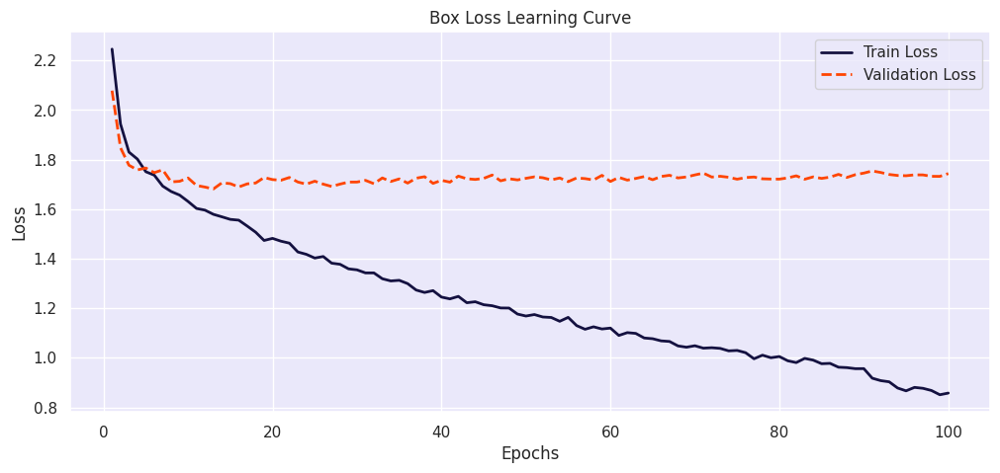

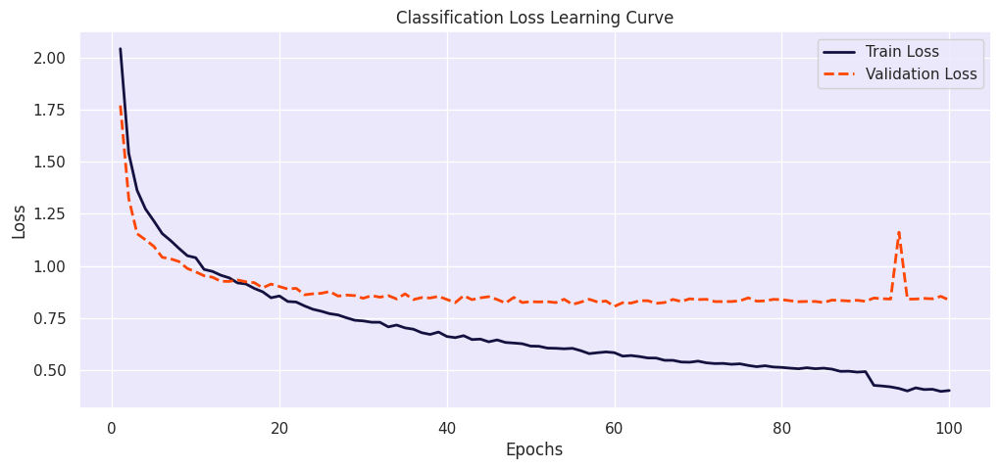

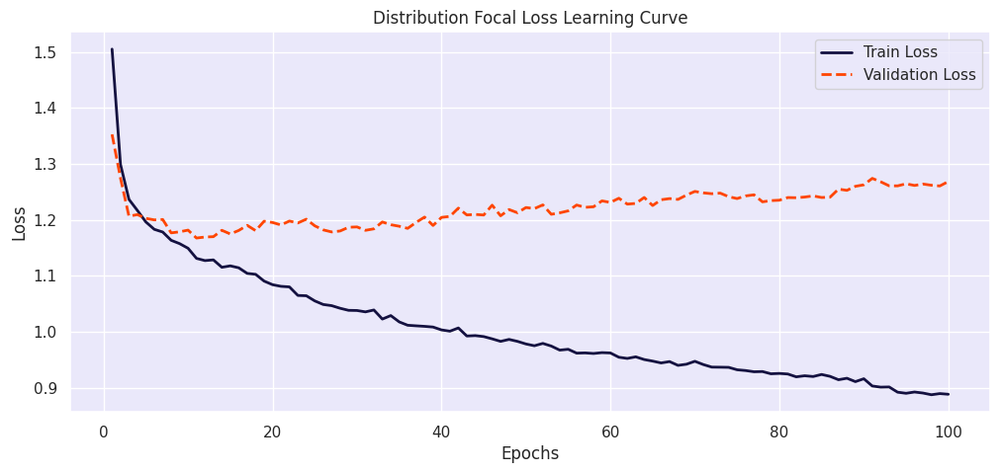

In [18]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

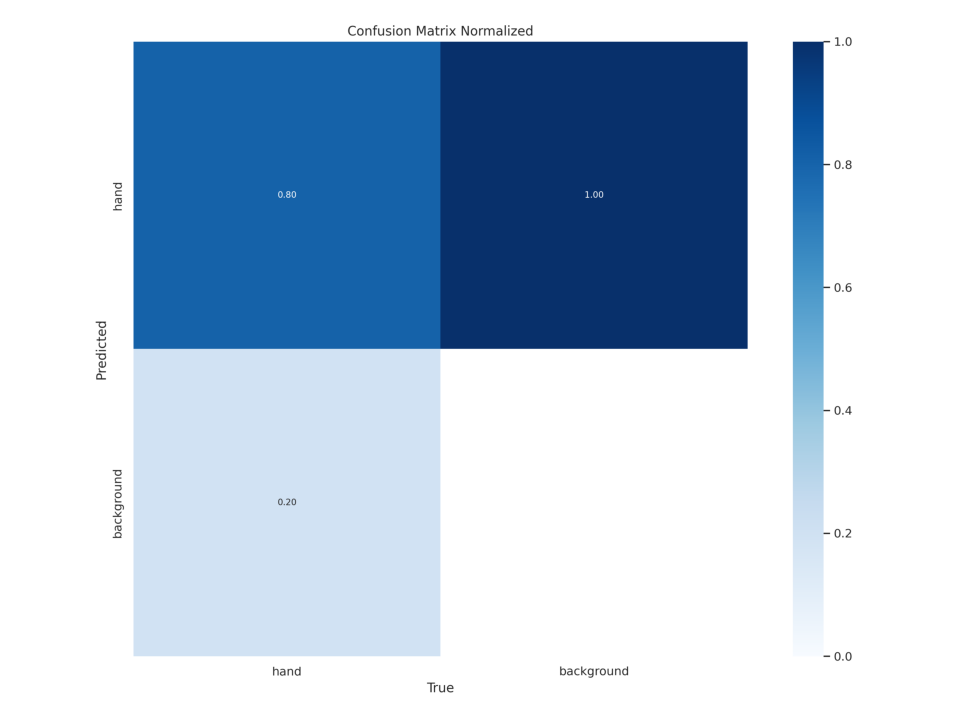

In [19]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

In [20]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9e summary (fused): 687 layers, 57,377,171 parameters, 0 gradients, 189.1 GFLOPs


val: Scanning /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/labels... 1223 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1223/1223 [00:02<00:00, 588.62it/s]

val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_1.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_19.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_35.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_40.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_45.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_89.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_90.jpg: 1 duplicate labels removed
va


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77 [00:30<00:00,  2.50it/s]


                   all       1223       2898      0.828      0.779       0.84       0.43
Speed: 0.1ms preprocess, 21.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val


In [21]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.828
metrics/recall(B),0.779
metrics/mAP50(B),0.840
metrics/mAP50-95(B),0.430
fitness,0.471



image 1/1 /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/VOC2007_794.jpg: 480x640 1 hand, 89.1ms
Speed: 2.7ms preprocess, 89.1ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Buffy_178.jpg: 640x576 1 hand, 90.5ms
Speed: 2.6ms preprocess, 90.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Skin_91.jpg: 640x288 (no detections), 89.9ms
Speed: 1.1ms preprocess, 89.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_70.jpg: 640x448 3 hands, 86.2ms
Speed: 1.9ms preprocess, 86.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /kaggle/input/oxford-handdataset/Oxford_handdataset/Hand/val/images/Inria_71.jpg: 640x288 2 hands, 31.0ms
Speed: 1.7ms prepr

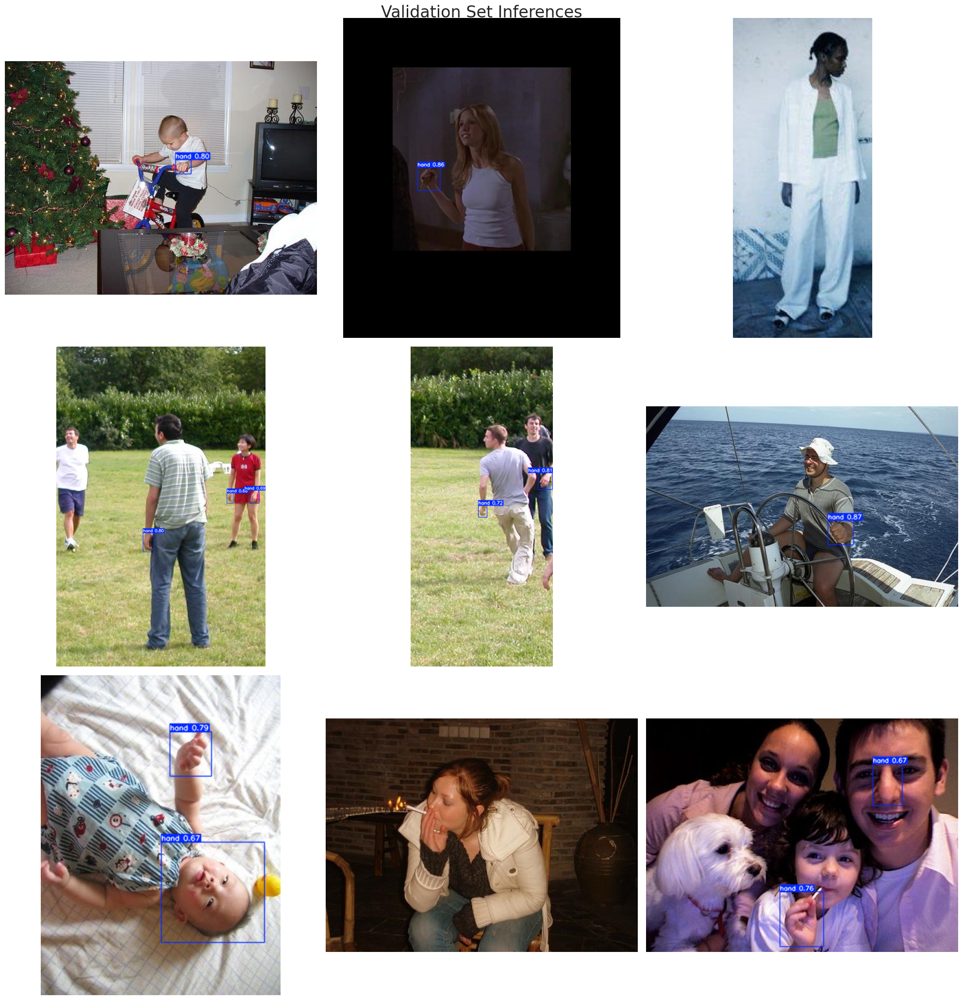

In [24]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path1, 'val', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


image 1/1 /kaggle/input/sample-image/CARDS_LIVINGROOM_B_T_frame_2591_jpg.rf.88854484564f503888556affce0b22fe.jpg: 384x640 1 hand, 93.1ms
Speed: 2.0ms preprocess, 93.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


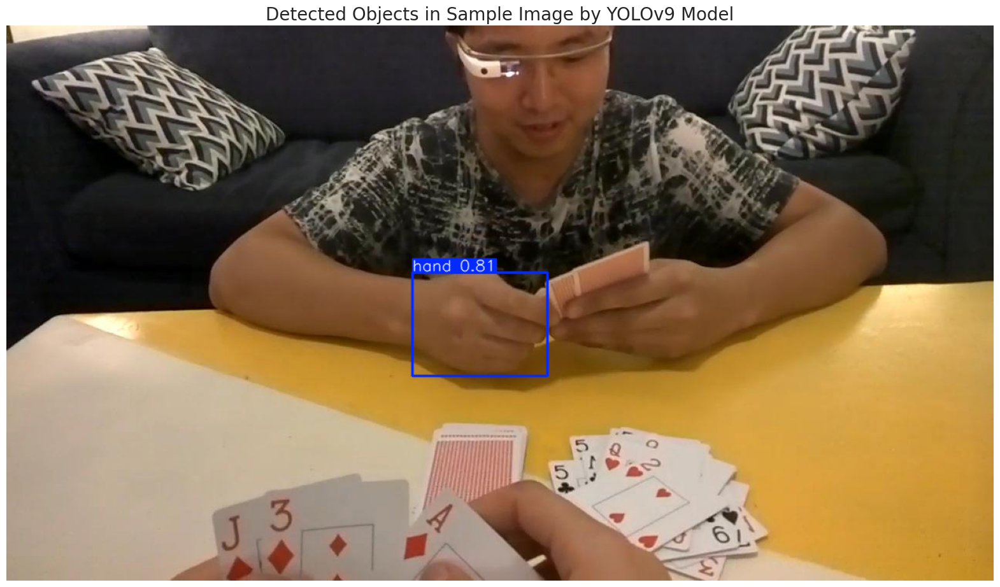

In [26]:
# Path to the image file
sample_image_path = '/kaggle/input/sample-image/CARDS_LIVINGROOM_B_T_frame_2591_jpg.rf.88854484564f503888556affce0b22fe.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7) 
                        
# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by YOLOv9 Model', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/kaggle/input/egohands/EgoHands-v1/sample_video.mp4'

# Define the destination path in the working directory
video_path = '/kaggle/working/sample_video.mp4'

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)

In [ ]:
# Convert the .avi video generated by the YOLOv9 prediction to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /kaggle/working/runs/detect/predict/sample_video.avi processed_sample_video.mp4

# Embed and display the processed sample video within the notebook
Video("processed_sample_video.mp4", embed=True, width=960)

In [ ]:
# Export the model
best_model.export(format='onnx')